In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!unzip "/content/drive/MyDrive/Colab Notebooks/one-piece.zip" -d "/content/datasets"

Streaming output truncated to the last 5000 lines.
  inflating: /content/datasets/one-piece/Mihawk/204.png  
  inflating: /content/datasets/one-piece/Mihawk/204.png_inverted.png  
  inflating: /content/datasets/one-piece/Mihawk/205.png  
  inflating: /content/datasets/one-piece/Mihawk/205.png_inverted.png  
  inflating: /content/datasets/one-piece/Mihawk/206.png  
  inflating: /content/datasets/one-piece/Mihawk/206.png_inverted.png  
  inflating: /content/datasets/one-piece/Mihawk/207.png  
  inflating: /content/datasets/one-piece/Mihawk/207.png_inverted.png  
  inflating: /content/datasets/one-piece/Mihawk/208.png  
  inflating: /content/datasets/one-piece/Mihawk/208.png_inverted.png  
  inflating: /content/datasets/one-piece/Mihawk/209.png  
  inflating: /content/datasets/one-piece/Mihawk/209.png_inverted.png  
  inflating: /content/datasets/one-piece/Mihawk/21.png  
  inflating: /content/datasets/one-piece/Mihawk/21.png_inverted.png  
  inflating: /content/datasets/one-piece/Mihawk/

#Datasets

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import os
from tqdm import tqdm

In [4]:
def data_augmentation(image):

    def rotate_image(image, angle):
        rotation_matrix = cv2.getRotationMatrix2D((image.shape[1] / 2, image.shape[0] / 2), angle, 1)
        return cv2.warpAffine(image, rotation_matrix, (image.shape[1], image.shape[0]))

    def flip_image(image, flip_code):
        return cv2.flip(image, flip_code)

    def add_noise(image, mean=0, std=25):
        noise = np.random.normal(mean, std, image.shape).astype(np.uint8)
        return cv2.add(image, noise)

    def blur_image(image, kernel_size=(15, 15)):
        return cv2.GaussianBlur(image, kernel_size, 0)

    augmented_images = []

    for angle in [-15, 0, 15]:
        rotated = rotate_image(image, angle)
        augmented_images.append(rotated)

    flipped = flip_image(image, 1)
    noisy = add_noise(image, mean=0, std=15)
    blurred = blur_image(image, kernel_size=(11, 11))

    augmented_images.extend([flipped, noisy, blurred])

    return augmented_images

In [5]:
X = []
y = []
size = (224, 224)

In [6]:
import os

directory_path = '/content/datasets/one-piece'
folder_names = [folder for folder in os.listdir(directory_path) if os.path.isdir(os.path.join(directory_path, folder))]

In [7]:
def importdatasets_name(name):
    input_dir = "/content/datasets/one-piece/" + name
    input_img_paths_jpg = sorted(
        [
            os.path.join(input_dir, fname)
            for fname in os.listdir(input_dir)
            if fname.endswith(".jpg")
        ]
    )

    input_img_paths_png = sorted(
        [
            os.path.join(input_dir, fname)
            for fname in os.listdir(input_dir)
            if fname.endswith(".png")
        ]
    )

    for i in input_img_paths_jpg:
      try:
        image = cv2.imread(i)
        image = cv2.resize(image, size)
        #image = data_augmentation(image)
        X.extend([image])
        y.extend([name])
      except:
        pass

    for i in input_img_paths_png:
      try:
        image = cv2.imread(i)
        image = cv2.resize(image, size)
        #image = data_augmentation(image)
        X.extend([image])
        y.extend([name])
      except:
        pass

In [8]:
for i in tqdm(folder_names):
  importdatasets_name(i)

100%|██████████| 18/18 [01:33<00:00,  5.19s/it]


#Preprocessing

In [9]:
class_names, y = np.unique(np.array(y), return_inverse=True)
class_names

array(['Ace', 'Akainu', 'Brook', 'Chopper', 'Crocodile', 'Franky',
       'Jinbei', 'Kurohige', 'Law', 'Luffy', 'Mihawk', 'Nami', 'Rayleigh',
       'Robin', 'Sanji', 'Shanks', 'Usopp', 'Zoro'], dtype='<U9')

In [10]:
len(set(y))

18

In [11]:
X = np.stack(X)
X.shape

(11712, 224, 224, 3)

In [12]:
from sklearn.model_selection import train_test_split

X, X_val, y, y_val = train_test_split(X, y, test_size=0.1, random_state=28, stratify=y)
X.shape, X_val.shape, y.shape, y_val.shape

((10540, 224, 224, 3), (1172, 224, 224, 3), (10540,), (1172,))

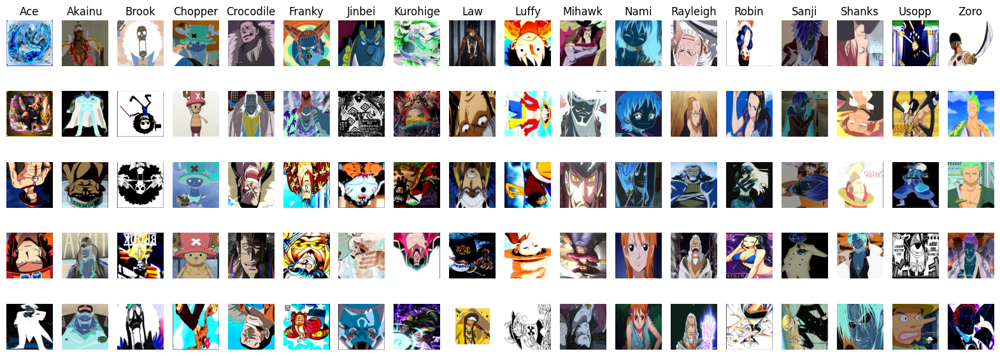

In [13]:
num_classes = len(np.unique(y))
samples_per_class = 5
plt.figure(figsize=(20, 7))
for i in range(num_classes):
    class_indices = np.where(y == i)[0]
    selected_indices = np.random.choice(class_indices, samples_per_class, replace=False)
    for j, idx in enumerate(selected_indices):
        plt.subplot(samples_per_class, num_classes, j * num_classes + i + 1)
        plt.imshow(np.array(X[idx][:, :, ::-1]))
        plt.axis('off')
        if j == 0:
            plt.title(f'{class_names[i]}')
plt.show()

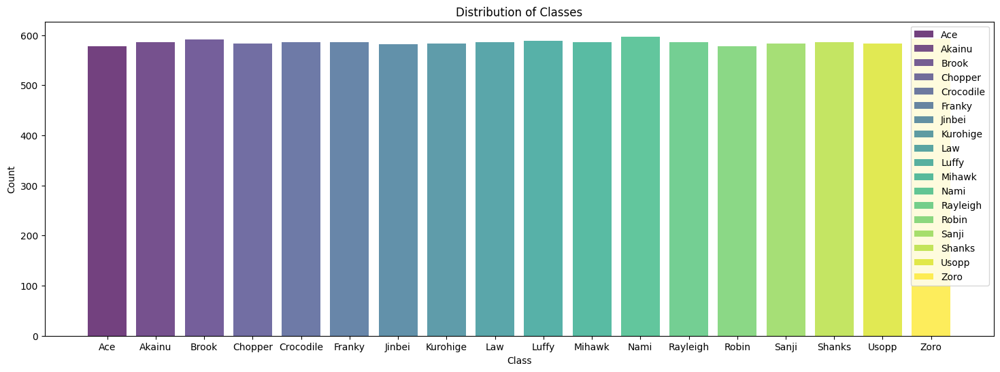

In [14]:
class_labels, class_counts = np.unique(y, return_counts=True)
colors = plt.cm.viridis(np.linspace(0, 1, len(class_labels)))
fig, ax = plt.subplots()
for i, (label, count) in enumerate(zip(class_labels, class_counts)):
    ax.bar(label, count, color=colors[i], alpha=0.75, label=f'{class_names[label]}')
ax.set_xlabel('Class')
ax.set_ylabel('Count')
ax.set_title('Distribution of Classes')
ax.set_xticks(class_labels)
ax.set_xticklabels([f'{class_names[label]}' for label in class_labels])
fig = plt.gcf()
fig.set_size_inches(18, 6)
ax.legend()
plt.show()

#Modeling

In [15]:
!pip install transformers[torch]
!pip install accelerate -U

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 270.9/270.9 kB 9.3 MB/s eta 0:00:00


##ResNet-152

In [ ]:
from transformers import AutoFeatureExtractor, ResNetForImageClassification, Trainer, TrainingArguments

feature_extractor = AutoFeatureExtractor.from_pretrained("microsoft/resnet-152")
model = ResNetForImageClassification.from_pretrained("microsoft/resnet-152", num_labels=len(set(y)), ignore_mismatched_sizes=True)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


preprocessor_config.json:   0%|          | 0.00/266 [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/transformers/models/convnext/feature_extraction_convnext.py:28: FutureWarning: The class ConvNextFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use ConvNextImageProcessor instead.
  warnings.warn(


config.json:   0%|          | 0.00/69.6k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/242M [00:00<?, ?B/s]

Some weights of ResNetForImageClassification were not initialized from the model checkpoint at microsoft/resnet-152 and are newly initialized because the shapes did not match:
- classifier.1.bias: found shape torch.Size([1000]) in the checkpoint and torch.Size([18]) in the model instantiated
- classifier.1.weight: found shape torch.Size([1000, 2048]) in the checkpoint and torch.Size([18, 2048]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [34]:
import torch
from torch.utils.data import Dataset

class CustomDataset(Dataset):
    def __init__(self, images, labels=None):
        self.images = images
        self.labels = labels

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image = torch.tensor(self.images[idx]).permute(2, 0, 1).float()
        if self.labels is not None:
            label = torch.tensor(self.labels[idx])
            return {"pixel_values": image, "label": label}
        else:
            return {"pixel_values": image}

train_dataset = CustomDataset(X, y)
val_dataset = CustomDataset(X_val, y_val)

In [ ]:
training_args = TrainingArguments(
    output_dir="./resnet_training_output",
    num_train_epochs=10,
    per_device_train_batch_size=16,
    per_device_eval_batch_size=16,
    warmup_steps=500,
    eval_steps=500,
    evaluation_strategy="epoch",
    weight_decay=0.01,
    logging_dir="./logs",
    learning_rate=1e-5,
)

trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=val_dataset,
)

trainer.train()

Epoch,Training Loss,Validation Loss
1,2.888600,2.862734
2,2.848300,2.721792
3,2.735600,2.501927
4,2.379700,2.208047
5,2.152900,1.889868
6,1.936200,1.657532
7,1.592600,1.463150
8,1.464700,1.348267
9,1.392700,1.274348
10,1.285500,1.241183


TrainOutput(global_step=6590, training_loss=2.016484997160337, metrics={'train_runtime': 2775.9706, 'train_samples_per_second': 37.969, 'train_steps_per_second': 2.374, 'total_flos': 5.538447204691968e+18, 'train_loss': 2.016484997160337, 'epoch': 10.0})

###Evaluate

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix

results = trainer.predict(val_dataset)
predicted_labels = torch.argmax(torch.tensor(results.predictions), axis=1).numpy()
accuracy = accuracy_score(y_val, predicted_labels)
f1 = f1_score(y_val, predicted_labels, average="weighted")

print(f"Validation Accuracy: {accuracy}")
print(f"Validation F1 Score: {f1}")

Validation Accuracy: 0.7457337883959044
Validation F1 Score: 0.7380574780677766


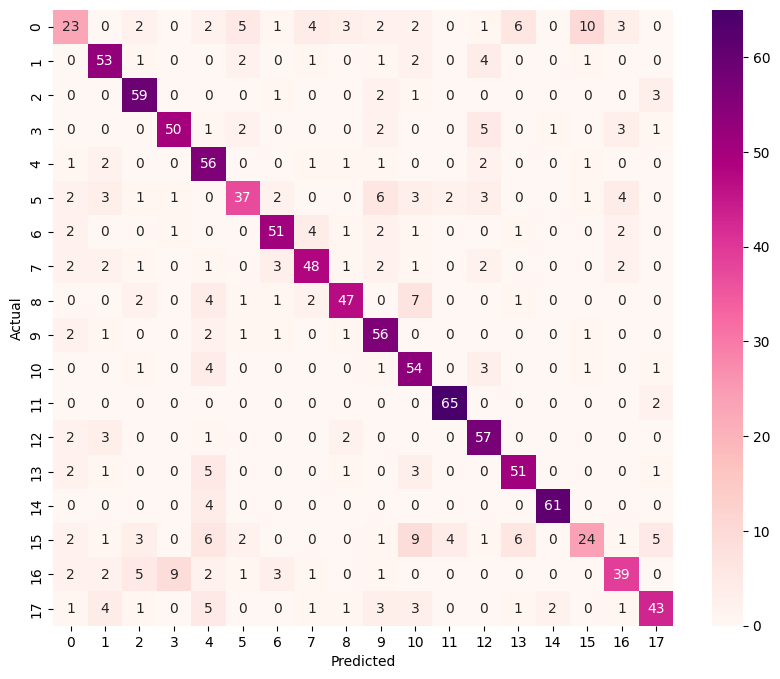

In [ ]:
plt.figure(figsize=(10, 8))
sns.heatmap(confusion_matrix(y_val, predicted_labels), annot=True, cmap='RdPu', fmt='g')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

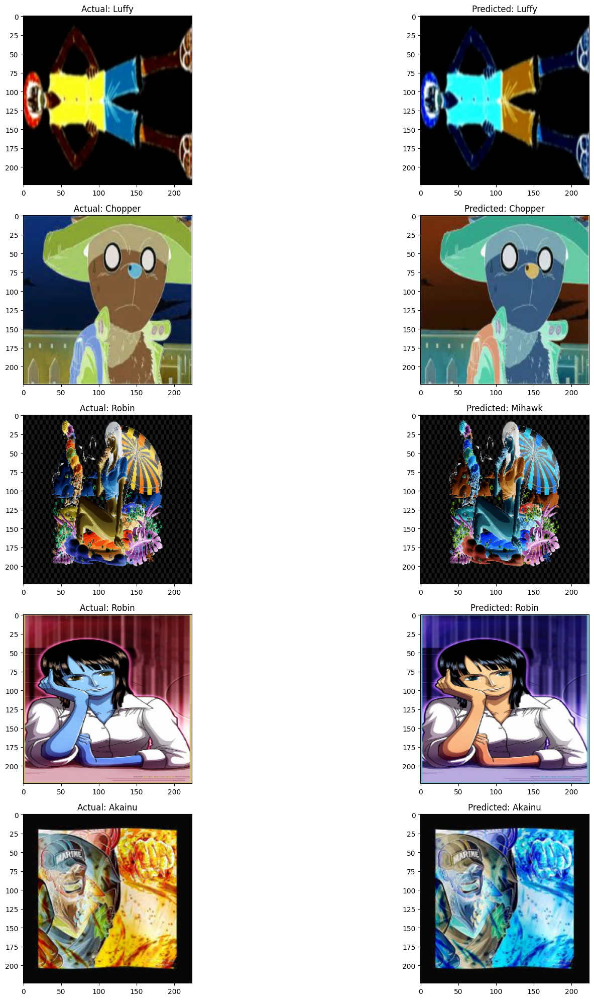

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

num_samples = 5
random_indices = np.random.choice(len(X_val), num_samples, replace=False)
plt.figure(figsize=(20, 20))
for i, idx in enumerate(random_indices, 1):
    plt.subplot(num_samples, 2, i * 2 - 1)
    plt.imshow(X_val[idx])
    plt.title(f"Actual: {class_names[y_val[idx]]}")
    plt.subplot(num_samples, 2, i * 2)
    plt.imshow(X_val[idx][:, :, ::-1])
    plt.title(f"Predicted: {class_names[predicted_labels[idx]]}")
plt.tight_layout()
plt.show()

In [36]:
class CustomDataset(Dataset):
    def __init__(self, images, labels=None):
        self.images = images
        self.labels = labels

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image = torch.tensor(self.images[idx]).permute(2, 0, 1).float()
        if self.labels is not None:
            label = torch.tensor(self.labels[idx])
            return {"pixel_values": image, "label": label}
        else:
            return {"pixel_values": image, "label": None}

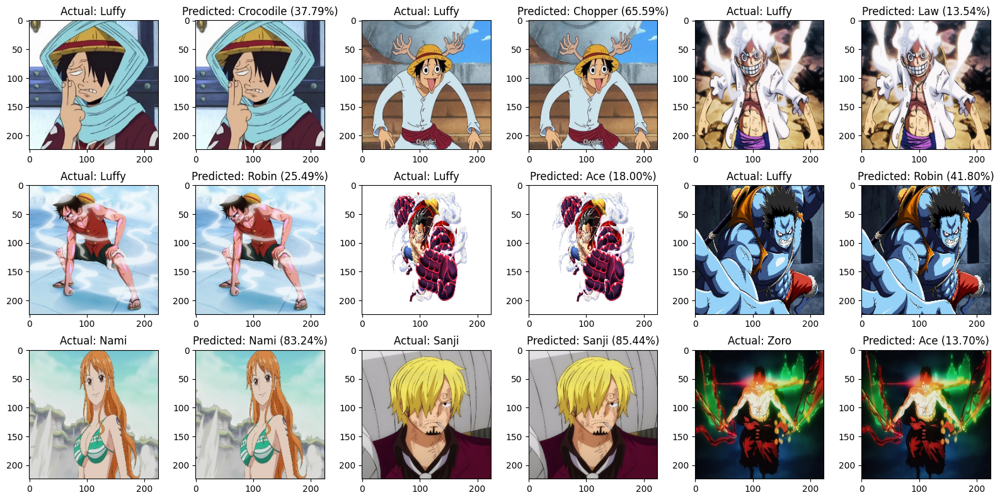

In [ ]:
model.to("cpu")
model.eval()

def predict_and_plot(image_path, subplot_index, act):
    image = cv2.imread(image_path)
    image = cv2.resize(image, size)
    imagetest = CustomDataset([image], labels=None)
    with torch.no_grad():
        pixel_values = imagetest[0]["pixel_values"].unsqueeze(0)
        logits = model(pixel_values)["logits"]
        probabilities = torch.nn.functional.softmax(logits, dim=1)
        predictions = torch.argmax(logits, dim=1).item()
        confidence = torch.max(probabilities).item() * 100
    plt.subplot(3, 6, subplot_index)
    plt.imshow(image[:,:,::-1])
    plt.title(f"Actual: {act}")
    plt.subplot(3, 6, subplot_index + 1)
    plt.imshow(image[:,:,::-1])
    plt.title(f"Predicted: {class_names[predictions]} ({confidence:.2f}%)")


plt.figure(figsize=(16, 8))
predict_and_plot("/content/luffy_face_sanji.jpg", 1, "Luffy")
predict_and_plot("/content/luffy_face_chop.jpg", 3, "Luffy")
predict_and_plot("/content/luffy5.png", 5, "Luffy")
predict_and_plot("/content/luffy2.jpg", 7, "Luffy")
predict_and_plot("/content/luffy4.jpg", 9, "Luffy")
predict_and_plot("/content/luffyzzz.jpg", 11, "Luffy")
predict_and_plot("/content/nami.webp", 13, "Nami")
predict_and_plot("/content/sanji.jpg", 15, "Sanji")
predict_and_plot("/content/zoro.webp", 17, "Zoro")

plt.tight_layout()
plt.show()

##ViTF

In [16]:
from transformers import ViTFeatureExtractor, ViTForImageClassification, Trainer, TrainingArguments

model_name = "google/vit-base-patch16-224"
feature_extractor = ViTFeatureExtractor(model_name)
model = ViTForImageClassification.from_pretrained(model_name, num_labels=len(set(y)), ignore_mismatched_sizes=True)

/usr/local/lib/python3.10/dist-packages/transformers/models/vit/feature_extraction_vit.py:28: FutureWarning: The class ViTFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use ViTImageProcessor instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/69.7k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized because the shapes did not match:
- classifier.bias: found shape torch.Size([1000]) in the checkpoint and torch.Size([18]) in the model instantiated
- classifier.weight: found shape torch.Size([1000, 768]) in the checkpoint and torch.Size([18, 768]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [44]:
import torch
from torch.utils.data import Dataset

class CustomDataset(Dataset):
    def __init__(self, images, labels=None):
        self.images = images
        self.labels = labels

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image = torch.tensor(self.images[idx]).permute(2, 0, 1).float()
        if self.labels is not None:
            label = torch.tensor(self.labels[idx])
            return {"pixel_values": image, "label": label}
        else:
            return {"pixel_values": image}

train_dataset = CustomDataset(X, y)
val_dataset = CustomDataset(X_val, y_val)

In [18]:
training_args = TrainingArguments(
    output_dir="./vit_training_output",
    num_train_epochs=10,
    per_device_train_batch_size=16,
    per_device_eval_batch_size=16,
    warmup_steps=500,
    eval_steps=500,
    evaluation_strategy="epoch",
    weight_decay=0.01,
    logging_dir="./logs",
    learning_rate=1e-5,
)

trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=val_dataset,
)

trainer.train()

Epoch,Training Loss,Validation Loss
1,2.800600,2.396709
2,2.281100,2.063498
3,1.956500,1.893645
4,1.567300,1.791649
5,1.417500,1.714167
6,1.307000,1.664822
7,1.081400,1.623869
8,1.001200,1.602356
9,0.936800,1.588795
10,0.829600,1.578633


TrainOutput(global_step=6590, training_loss=1.4553363562715613, metrics={'train_runtime': 3985.3902, 'train_samples_per_second': 26.447, 'train_steps_per_second': 1.654, 'total_flos': 8.168826971212186e+18, 'train_loss': 1.4553363562715613, 'epoch': 10.0})

###Evaluate

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix

results = trainer.predict(val_dataset)
predicted_labels = torch.argmax(torch.tensor(results.predictions), axis=1).numpy()
accuracy = accuracy_score(y_val, predicted_labels)
f1 = f1_score(y_val, predicted_labels, average="weighted")

print(f"Validation Accuracy: {accuracy}")
print(f"Validation F1 Score: {f1}")

Validation Accuracy: 0.5119453924914675
Validation F1 Score: 0.5105474703903635


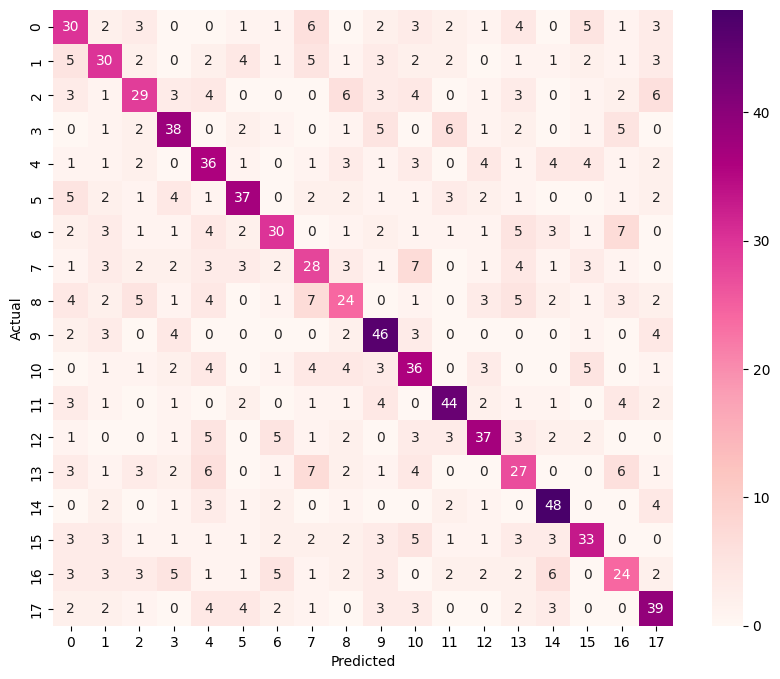

In [20]:
plt.figure(figsize=(10, 8))
sns.heatmap(confusion_matrix(y_val, predicted_labels), annot=True, cmap='RdPu', fmt='g')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

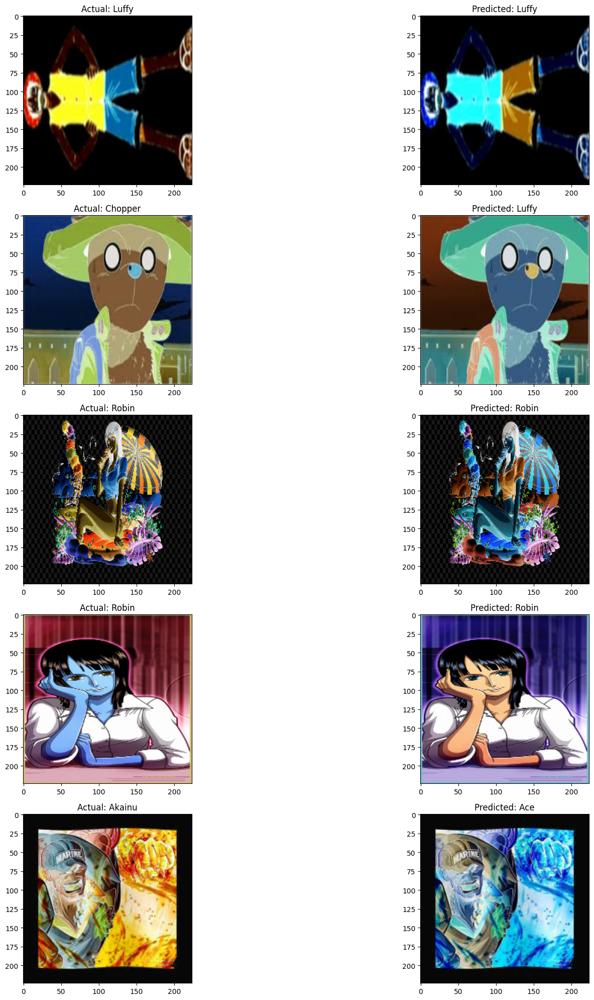

In [24]:
import matplotlib.pyplot as plt
import numpy as np

num_samples = 5
random_indices = np.random.choice(len(X_val), num_samples, replace=False)
plt.figure(figsize=(20, 20))
for i, idx in enumerate(random_indices, 1):
    plt.subplot(num_samples, 2, i * 2 - 1)
    plt.imshow(X_val[idx])
    plt.title(f"Actual: {class_names[y_val[idx]]}")
    plt.subplot(num_samples, 2, i * 2)
    plt.imshow(X_val[idx][:, :, ::-1])
    plt.title(f"Predicted: {class_names[predicted_labels[idx]]}")
plt.tight_layout()
plt.show()

In [28]:
class CustomDataset(Dataset):
    def __init__(self, images, labels=None):
        self.images = images
        self.labels = labels

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image = torch.tensor(self.images[idx]).permute(2, 0, 1).float()
        if self.labels is not None:
            label = torch.tensor(self.labels[idx])
            return {"pixel_values": image, "label": label}
        else:
            return {"pixel_values": image, "label": None}

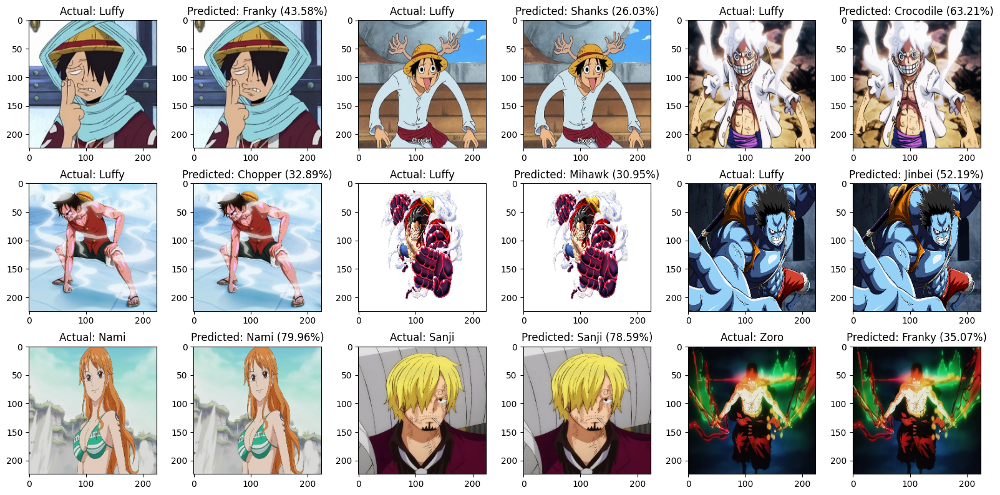

In [29]:
model.to("cpu")
model.eval()

def predict_and_plot(image_path, subplot_index, act):
    image = cv2.imread(image_path)
    image = cv2.resize(image, size)
    imagetest = CustomDataset([image], labels=None)
    with torch.no_grad():
        pixel_values = imagetest[0]["pixel_values"].unsqueeze(0)
        logits = model(pixel_values)["logits"]
        probabilities = torch.nn.functional.softmax(logits, dim=1)
        predictions = torch.argmax(logits, dim=1).item()
        confidence = torch.max(probabilities).item() * 100
    plt.subplot(3, 6, subplot_index)
    plt.imshow(image[:,:,::-1])
    plt.title(f"Actual: {act}")
    plt.subplot(3, 6, subplot_index + 1)
    plt.imshow(image[:,:,::-1])
    plt.title(f"Predicted: {class_names[predictions]} ({confidence:.2f}%)")


plt.figure(figsize=(16, 8))
predict_and_plot("/content/luffy_face_sanji.jpg", 1, "Luffy")
predict_and_plot("/content/luffy_face_chop.jpg", 3, "Luffy")
predict_and_plot("/content/luffy5.png", 5, "Luffy")
predict_and_plot("/content/luffy2.jpg", 7, "Luffy")
predict_and_plot("/content/luffy4.jpg", 9, "Luffy")
predict_and_plot("/content/luffyzzz.jpg", 11, "Luffy")
predict_and_plot("/content/nami.webp", 13, "Nami")
predict_and_plot("/content/sanji.jpg", 15, "Sanji")
predict_and_plot("/content/zoro.webp", 17, "Zoro")

plt.tight_layout()
plt.show()

##Swin

In [ ]:
from transformers import SwinForImageClassification, TrainingArguments, Trainer

model_name = "microsoft/swin-base-patch4-window7-224"
model = SwinForImageClassification.from_pretrained(model_name)

config.json:   0%|          | 0.00/71.8k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/352M [00:00<?, ?B/s]

In [ ]:
import torch
from torch.utils.data import Dataset

class CustomDataset(Dataset):
    def __init__(self, images, labels=None):
        self.images = images
        self.labels = labels

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image = self.images[idx].transpose(2, 0, 1).astype(np.float32) / 255.0
        if self.labels is not None:
            label = torch.tensor(self.labels[idx])
            return {"pixel_values": torch.tensor(image), "label": label}
        else:
            return {"pixel_values": torch.tensor(image)}

train_dataset = CustomDataset(X, y)
val_dataset = CustomDataset(X_val, y_val)

In [ ]:
training_args = TrainingArguments(
    output_dir="./swin_training_output",
    num_train_epochs=10,
    per_device_train_batch_size=16,
    per_device_eval_batch_size=16,
    warmup_steps=500,
    eval_steps=500,
    evaluation_strategy="epoch",
    weight_decay=0.01,
    logging_dir="./logs",
    learning_rate=1e-5,
)

trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=val_dataset,
)

trainer.train()

Epoch,Training Loss,Validation Loss
1,3.724000,0.445901
2,0.507500,0.067704
3,0.124300,0.041414
4,0.016900,0.011691
5,0.012900,0.011451
6,0.007900,0.005437
7,0.002100,0.001863
8,0.003000,0.001746
9,0.001600,0.001893
10,0.001300,0.002739


TrainOutput(global_step=6590, training_loss=0.3378478949886714, metrics={'train_runtime': 3954.5568, 'train_samples_per_second': 26.653, 'train_steps_per_second': 1.666, 'total_flos': 8.355000170564813e+18, 'train_loss': 0.3378478949886714, 'epoch': 10.0})

###Evaluate

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix

results = trainer.predict(val_dataset)
predicted_labels = torch.argmax(torch.tensor(results.predictions), axis=1).numpy()
accuracy = accuracy_score(y_val, predicted_labels)
f1 = f1_score(y_val, predicted_labels, average="weighted")

print(f"Validation Accuracy: {accuracy}")
print(f"Validation F1 Score: {f1}")

Validation Accuracy: 0.9991467576791809
Validation F1 Score: 0.999146707188482


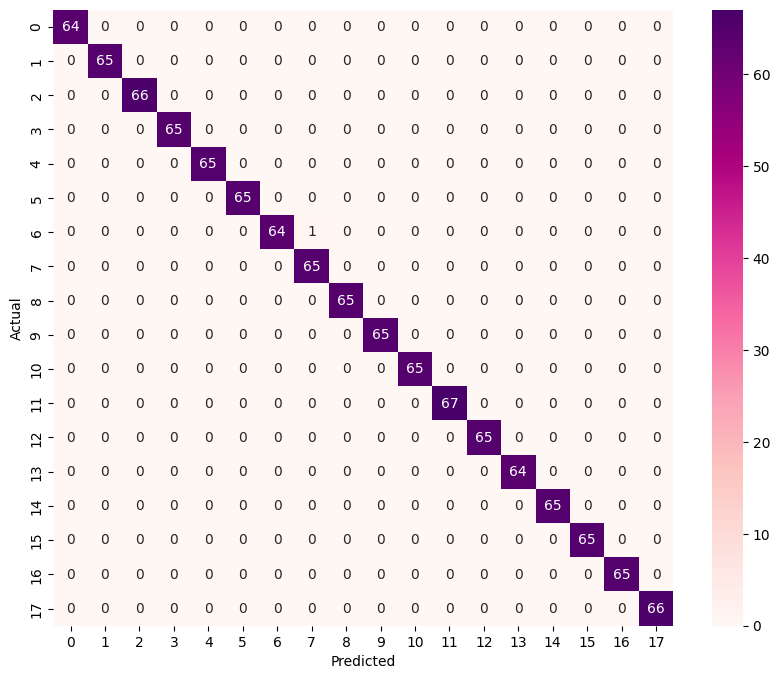

In [ ]:
plt.figure(figsize=(10, 8))
sns.heatmap(confusion_matrix(y_val, predicted_labels), annot=True, cmap='RdPu', fmt='g')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

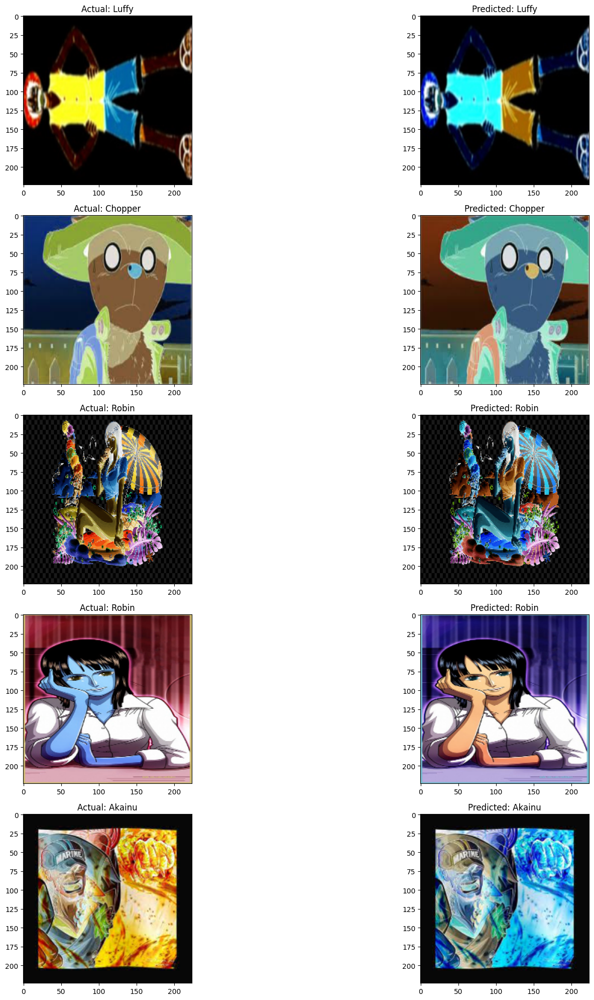

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

num_samples = 5
random_indices = np.random.choice(len(X_val), num_samples, replace=False)
plt.figure(figsize=(20, 20))
for i, idx in enumerate(random_indices, 1):
    plt.subplot(num_samples, 2, i * 2 - 1)
    plt.imshow(X_val[idx])
    plt.title(f"Actual: {class_names[y_val[idx]]}")
    plt.subplot(num_samples, 2, i * 2)
    plt.imshow(X_val[idx][:, :, ::-1])
    plt.title(f"Predicted: {class_names[predicted_labels[idx]]}")
plt.tight_layout()
plt.show()

In [ ]:
class CustomDataset(Dataset):
    def __init__(self, images, labels=None):
        self.images = images
        self.labels = labels

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image = self.images[idx].transpose(2, 0, 1).astype(np.float32) / 255.0
        if self.labels is not None:
            label = torch.tensor(self.labels[idx])
            return {"pixel_values": torch.tensor(image), "label": label}
        else:
            return {"pixel_values": torch.tensor(image), "label": None}

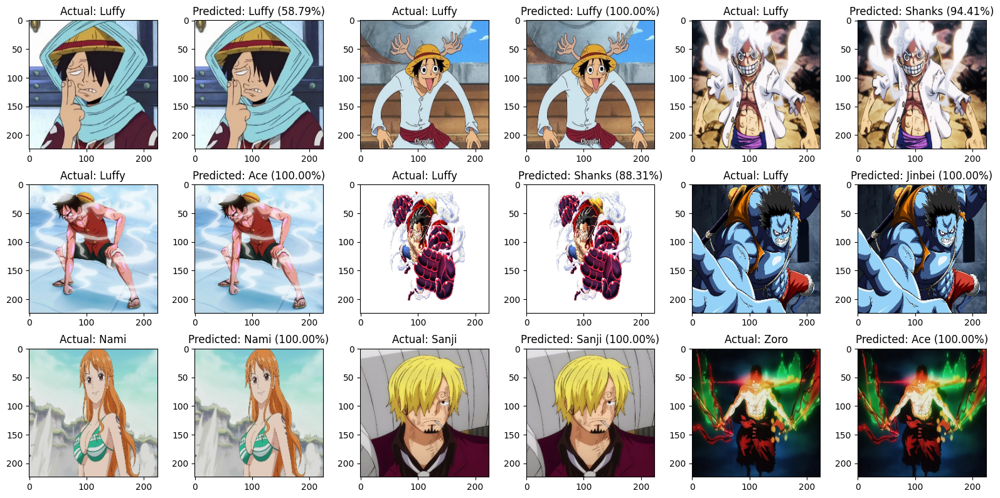

In [ ]:
model.to("cpu")
model.eval()

def predict_and_plot(image_path, subplot_index, act):
    image = cv2.imread(image_path)
    image = cv2.resize(image, size)
    imagetest = CustomDataset([image], labels=None)
    with torch.no_grad():
        pixel_values = imagetest[0]["pixel_values"].unsqueeze(0)
        logits = model(pixel_values)["logits"]
        probabilities = torch.nn.functional.softmax(logits, dim=1)
        predictions = torch.argmax(logits, dim=1).item()
        confidence = torch.max(probabilities).item() * 100
    predictions = min(predictions, len(set(y)) - 1)
    plt.subplot(3, 6, subplot_index)
    plt.imshow(image[:,:,::-1])
    plt.title(f"Actual: {act}")
    plt.subplot(3, 6, subplot_index + 1)
    plt.imshow(image[:,:,::-1])
    plt.title(f"Predicted: {class_names[predictions]} ({confidence:.2f}%)")


plt.figure(figsize=(16, 8))
predict_and_plot("/content/luffy_face_sanji.jpg", 1, "Luffy")
predict_and_plot("/content/luffy_face_chop.jpg", 3, "Luffy")
predict_and_plot("/content/luffy5.png", 5, "Luffy")
predict_and_plot("/content/luffy2.jpg", 7, "Luffy")
predict_and_plot("/content/luffy4.jpg", 9, "Luffy")
predict_and_plot("/content/luffyzzz.jpg", 11, "Luffy")
predict_and_plot("/content/nami.webp", 13, "Nami")
predict_and_plot("/content/sanji.jpg", 15, "Sanji")
predict_and_plot("/content/zoro.webp", 17, "Zoro")

plt.tight_layout()
plt.show()